In [1]:
import os
import re
import json
import pickle
from pathlib import Path
import yaml

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy
import skimage
import pandas as pd
import torch
import tifffile
from einops import rearrange, repeat

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.data.datasets as datasets
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.multiplex as multiplex
import mushroom.data.he as he
import mushroom.registration.bigwarp as bigwarp
from mushroom.mushroom import Mushroom

In [6]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1'
output_dir = os.path.join(project_dir, 'analysis', 'export')
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [7]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
    
    if 'trainer_kwargs' in config and config['trainer_kwargs']['data_mask'] is not None:
        config['trainer_kwargs']['data_mask'] = config['trainer_kwargs']['data_mask'].replace(source_root, target_root)
        
    return config

In [8]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [9]:
# exclude = ['S18-25943-A7', 'C3L-00970', 'WD-76845']

In [10]:
fps = sorted(utils.listfiles(project_dir, regex=r'mushroom_50res/config.yaml$'))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/C3L-00970/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-00982/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-01287/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-02551/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT225C1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT339B2-H1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-K2/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/mushroom_50res/co

In [11]:
case_to_sections = {fp.split('/')[-3]:yaml.safe_load(open(fp))['sections'] for fp in fps}
# case_to_sections = {k:v for k, v in case_to_sections.items() if k not in exclude}
case_to_sections.keys()

dict_keys(['C3L-00970', 'C3L-00982', 'C3L-01287', 'C3L-02551', 'HT206B1', 'HT225C1', 'HT268B1', 'HT339B2-H1', 'HT397B1', 'HT413C1-K2', 'HT413C1-Th1k4A1', 'HT448C1-Th1K1Fp1', 'HT553P1-H2', 'HT565B1-H2', 'S18-25943-A7', 'S18-5591-C8', 'S18-9906', 'P21_F2RM6R'])

In [12]:
# case = 'HT206B1'
case = 'HT413C1-Th1k4A1'

In [13]:
sections = case_to_sections[case]
sections

[{'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s0_HT413C1-Th1k4A1-U14_he.tif'}],
  'position': 0,
  'sid': 'HT413C1-Th1k4A1-U14'},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s1_HT413C1-Th1k4A1-U18_he.tif'}],
  'position': 20,
  'sid': 'HT413C1-Th1k4A1-U18'},
 {'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s2_HT413C1-Th1k4A1-U19_xenium.h5ad'}],
  'position': 25,
  'sid': 'HT413C1-Th1k4A1-U19'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s3_HT413C1-Th1k4A1-U20_multiplex.ome.tiff'}],
  'position': 30,
  'sid': 'HT413C1-Th1k4A1-U20'},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s4_HT413C1-Th1k4A1-U1_h

In [14]:
dtype_to_volume = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled']

outputs = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl'), 'rb')
)
section_ids = outputs['section_ids']
section_positions = outputs['section_positions']
section_ids, section_positions

([('HT413C1-Th1k4A1-U14', 'he'),
  ('HT413C1-Th1k4A1-U18', 'he'),
  ('HT413C1-Th1k4A1-U19', 'xenium'),
  ('HT413C1-Th1k4A1-U20', 'multiplex'),
  ('HT413C1-Th1k4A1-U1', 'he'),
  ('HT413C1-Th1k4A1-U2', 'xenium'),
  ('HT413C1-Th1k4A1-U3', 'multiplex'),
  ('HT413C1-Th1k4A1-U4', 'he'),
  ('HT413C1-Th1k4A1-U7', 'cosmx'),
  ('HT413C1-Th1k4A1-U8', 'he'),
  ('HT413C1-Th1k4A1-U9', 'xenium'),
  ('HT413C1-Th1k4A1-U11', 'he'),
  ('HT413C1-Th1k4A1-U21', 'he'),
  ('HT413C1-Th1k4A1-U24', 'he'),
  ('HT413C1-Th1k4A1-U25', 'xenium'),
  ('HT413C1-Th1k4A1-U26', 'multiplex'),
  ('HT413C1-Th1k4A1-U27', 'he'),
  ('HT413C1-Th1k4A1-U29', 'he'),
  ('HT413C1-Th1k4A1-U30', 'he'),
  ('HT413C1-Th1k4A1-U32', 'multiplex'),
  ('HT413C1-Th1k4A1-U34', 'cosmx'),
  ('HT413C1-Th1k4A1-U35', 'he'),
  ('HT413C1-Th1k4A1-U36', 'xenium'),
  ('HT413C1-Th1k4A1-U37', 'multiplex'),
  ('HT413C1-Th1k4A1-U38', 'he'),
  ('HT413C1-Th1k4A1-U40', 'he'),
  ('HT413C1-Th1k4A1-U41', 'multiplex'),
  ('HT413C1-Th1k4A1-U42', 'multiplex')],
 array(

In [15]:
mushroom = Mushroom.from_config(
    os.path.join(project_dir, case, 'mushroom_50res'), accelerator='cpu'
)

INFO:root:loading spore for cosmx
INFO:root:data mask detected
INFO:root:starting cosmx processing
INFO:root:using 1000 channels
INFO:root:2 sections detected: ['HT413C1-Th1k4A1-U7', 'HT413C1-Th1k4A1-U34']
INFO:root:processing sections
INFO:root:generating image data for section HT413C1-Th1k4A1-U7
INFO:root:generating image data for section HT413C1-Th1k4A1-U34
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT413C1-Th1k4A1-U7', 'cosmx'), ('HT413C1-Th1k4A1-U34', 'cosmx')]
INFO:root:creating data loaders
INFO:torch.distributed.nn.jit.instantiator:Created a temporary directory at /tmp/tmpdgba_dvn
INFO:torch.distributed.nn.jit.instantiator:Writing /tmp/tmpdgba_dvn/_remote_module_non_scriptable.py
INFO:root:creating ViT


cosmx torch.Size([1000, 102, 73])


INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/mushroom_50res/cosmx_chkpts/last-v2.ckpt
INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:14 sections detected: ['HT413C1-Th1k4A1-U14', 'HT413C1-Th1k4A1-U18', 'HT413C1-Th1k4A1-U1', 'HT413C1-Th1k4A1-U4', 'HT413C1-Th1k4A1-U8', 'HT413C1-Th1k4A1-U11', 'HT413C1-Th1k4A1-U21', 'HT413C1-Th1k4A1-U24', 'HT413C1-Th1k4A1-U27', 'HT413C1-Th1k4A1-U29', 'HT413C1-Th1k4A1-U30', 'HT413C1-Th1k4A1-U35', 'HT413C1-Th1k4A1-U38', 'HT413C1-Th1k4A1-U40']
INFO:root:processing sections
INFO:root:genera

0.02


INFO:root:generating image data for section HT413C1-Th1k4A1-U1
INFO:root:generating image data for section HT413C1-Th1k4A1-U4
INFO:root:generating image data for section HT413C1-Th1k4A1-U8
INFO:root:generating image data for section HT413C1-Th1k4A1-U11
INFO:root:generating image data for section HT413C1-Th1k4A1-U21
INFO:root:generating image data for section HT413C1-Th1k4A1-U24
INFO:root:generating image data for section HT413C1-Th1k4A1-U27
INFO:root:generating image data for section HT413C1-Th1k4A1-U29
INFO:root:generating image data for section HT413C1-Th1k4A1-U30
INFO:root:generating image data for section HT413C1-Th1k4A1-U35
INFO:root:generating image data for section HT413C1-Th1k4A1-U38
INFO:root:generating image data for section HT413C1-Th1k4A1-U40
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 14 sections detected: [('HT413C1-Th1k4A1-U14', 'he'), ('HT413C1-Th1k4A1-U18', 'he'), ('HT413C1-Th1k4A1-U1', 'he'), ('HT413C1-Th1k4A1-U4', '

he torch.Size([3, 101, 72])


INFO:root:using 27 channels
INFO:root:7 sections detected: ['HT413C1-Th1k4A1-U20', 'HT413C1-Th1k4A1-U3', 'HT413C1-Th1k4A1-U26', 'HT413C1-Th1k4A1-U32', 'HT413C1-Th1k4A1-U37', 'HT413C1-Th1k4A1-U41', 'HT413C1-Th1k4A1-U42']
INFO:root:processing sections
INFO:root:generating image data for section HT413C1-Th1k4A1-U20


0.02


INFO:root:generating image data for section HT413C1-Th1k4A1-U3
INFO:root:generating image data for section HT413C1-Th1k4A1-U26
INFO:root:generating image data for section HT413C1-Th1k4A1-U32
INFO:root:generating image data for section HT413C1-Th1k4A1-U37
INFO:root:generating image data for section HT413C1-Th1k4A1-U41
INFO:root:generating image data for section HT413C1-Th1k4A1-U42
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 7 sections detected: [('HT413C1-Th1k4A1-U20', 'multiplex'), ('HT413C1-Th1k4A1-U3', 'multiplex'), ('HT413C1-Th1k4A1-U26', 'multiplex'), ('HT413C1-Th1k4A1-U32', 'multiplex'), ('HT413C1-Th1k4A1-U37', 'multiplex'), ('HT413C1-Th1k4A1-U41', 'multiplex'), ('HT413C1-Th1k4A1-U42', 'multiplex')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPU

multiplex torch.Size([27, 101, 72])


INFO:root:using 477 channels
INFO:root:5 sections detected: ['HT413C1-Th1k4A1-U19', 'HT413C1-Th1k4A1-U2', 'HT413C1-Th1k4A1-U9', 'HT413C1-Th1k4A1-U25', 'HT413C1-Th1k4A1-U36']
INFO:root:processing sections
INFO:root:generating image data for section HT413C1-Th1k4A1-U19
INFO:root:generating image data for section HT413C1-Th1k4A1-U2
INFO:root:generating image data for section HT413C1-Th1k4A1-U9
INFO:root:generating image data for section HT413C1-Th1k4A1-U25
INFO:root:generating image data for section HT413C1-Th1k4A1-U36
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 5 sections detected: [('HT413C1-Th1k4A1-U19', 'xenium'), ('HT413C1-Th1k4A1-U2', 'xenium'), ('HT413C1-Th1k4A1-U9', 'xenium'), ('HT413C1-Th1k4A1-U25', 'xenium'), ('HT413C1-Th1k4A1-U36', 'xenium')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, u

xenium torch.Size([477, 102, 73])


INFO:root:chkpt files detected, embedding to spores
INFO:root:embedding cosmx spore
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Predicting: |                                                                                                 …

INFO:root:embedding he spore


Predicting: |                                                                                                 …

INFO:root:embedding multiplex spore


Predicting: |                                                                                                 …

INFO:root:embedding xenium spore


Predicting: |                                                                                                 …

In [16]:
outputs = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl'), 'rb')
)
outputs.keys()

dict_keys(['section_positions', 'section_ids', 'dtype_to_volume', 'dtype_to_volume_probs', 'dtype_to_clusters', 'dtype_to_cluster_probs', 'dtype_to_cluster_probs_all', 'dtype_to_cluster_intensities', 'dtype_to_cluster_to_agg'])

In [17]:
dtype = 'xenium'
spore = mushroom.dtype_to_spore[dtype]
combined = None
for sid, a in spore.learner_data.dtype_to_section_to_adata[dtype].items():
    for level in range(mushroom.num_levels):
        pts = a.obsm['spatial']
        labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=level)
        a.obs[f'nbhd_{dtype}_level{level}'] = [f'nbhd {x}' for x in labels]
        
        dtype_to_volume = pickle.load(
            open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l{level}.pkl'), 'rb')
        )['labeled']
        
        labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=level, use_volume=True, volume=dtype_to_volume['integrated'])
        a.obs[f'nbhd_integrated_level{level}'] = [f'nbhd {x}' for x in labels]
        
        labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=level, use_volume=True, volume=dtype_to_volume['multiplex'])
        a.obs[f'nbhd_multiplex_level{level}'] = [f'nbhd {x}' for x in labels]
    df = a.obs[[x for x in a.obs.columns if 'nbhd' in x]]
    df['sid'] = sid
    df.index = [f'{sid}-{x}' for x in df.index.to_list()]
    
    if combined is None:
        combined = df
    else:
        combined = pd.concat((combined, df))
combined
        

/tmp/ipykernel_1263488/1656955858.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  a.obs[f'nbhd_{dtype}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1263488/1656955858.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sid'] = sid
/tmp/ipykernel_1263488/1656955858.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  a.obs[f'nbhd_{dtype}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1263488/1656955858.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

,nbhd_xenium_level0,nbhd_integrated_level0,nbhd_multiplex_level0,nbhd_xenium_level1,nbhd_integrated_level1,nbhd_multiplex_level1,nbhd_xenium_level2,nbhd_integrated_level2,nbhd_multiplex_level2,sid
HT413C1-Th1k4A1-U19-aaaaahcn-1,nbhd 0,nbhd 12,nbhd 3,nbhd 0,nbhd 19,nbhd 8,nbhd 1,nbhd 10,nbhd 15,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaaaibcn-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaabchmf-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaacfenh-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaachjof-1,nbhd 0,nbhd 12,nbhd 3,nbhd 0,nbhd 19,nbhd 8,nbhd 1,nbhd 10,nbhd 15,HT413C1-Th1k4A1-U19
...,...,...,...,...,...,...,...,...,...,...
HT413C1-Th1k4A1-U36-oilbbedb-1,nbhd 3,nbhd 6,nbhd 5,nbhd 11,nbhd 1,nbhd 16,nbhd 18,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36
HT413C1-Th1k4A1-U36-oilbldfc-1,nbhd 3,nbhd 6,nbhd 5,nbhd 10,nbhd 1,nbhd 16,nbhd 16,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36
HT413C1-Th1k4A1-U36-oilblnpd-1,nbhd 3,nbhd 6,nbhd 5,nbhd 11,nbhd 1,nbhd 16,nbhd 18,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36
HT413C1-Th1k4A1-U36-oilbplcp-1,nbhd 3,nbhd 6,nbhd 5,nbhd 10,nbhd 1,nbhd 16,nbhd 16,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36


In [18]:
combined

,nbhd_xenium_level0,nbhd_integrated_level0,nbhd_multiplex_level0,nbhd_xenium_level1,nbhd_integrated_level1,nbhd_multiplex_level1,nbhd_xenium_level2,nbhd_integrated_level2,nbhd_multiplex_level2,sid
HT413C1-Th1k4A1-U19-aaaaahcn-1,nbhd 0,nbhd 12,nbhd 3,nbhd 0,nbhd 19,nbhd 8,nbhd 1,nbhd 10,nbhd 15,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaaaibcn-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaabchmf-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaacfenh-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19
HT413C1-Th1k4A1-U19-aaachjof-1,nbhd 0,nbhd 12,nbhd 3,nbhd 0,nbhd 19,nbhd 8,nbhd 1,nbhd 10,nbhd 15,HT413C1-Th1k4A1-U19
...,...,...,...,...,...,...,...,...,...,...
HT413C1-Th1k4A1-U36-oilbbedb-1,nbhd 3,nbhd 6,nbhd 5,nbhd 11,nbhd 1,nbhd 16,nbhd 18,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36
HT413C1-Th1k4A1-U36-oilbldfc-1,nbhd 3,nbhd 6,nbhd 5,nbhd 10,nbhd 1,nbhd 16,nbhd 16,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36
HT413C1-Th1k4A1-U36-oilblnpd-1,nbhd 3,nbhd 6,nbhd 5,nbhd 11,nbhd 1,nbhd 16,nbhd 18,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36
HT413C1-Th1k4A1-U36-oilbplcp-1,nbhd 3,nbhd 6,nbhd 5,nbhd 10,nbhd 1,nbhd 16,nbhd 16,nbhd 1,nbhd 26,HT413C1-Th1k4A1-U36


In [19]:
set(combined['sid'])

{'HT413C1-Th1k4A1-U19',
 'HT413C1-Th1k4A1-U2',
 'HT413C1-Th1k4A1-U25',
 'HT413C1-Th1k4A1-U36',
 'HT413C1-Th1k4A1-U9'}

#### read in previous cell types

In [20]:
meta = pd.read_csv(
    '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/auxiliary/xenium/HT206B1-H2L1Us1_17_cell_type.txt',
    sep='\t', index_col=0
)
meta

,cell_type
aaaaeefm-1,Nothing
aaaagokl-1,Cancer cells
aaaaippd-1,Cancer cells
aaaajeja-1,Cancer cells
aaablpen-1,Cancer cells
...,...
oikcfelo-1,T-cells
oikcgcbk-1,T-cells
oikdmjki-1,Plasma cells
oikecdga-1,T-cells


In [21]:
for sid in set(combined['sid']):
    print(sid)
    df = combined[combined['sid']==sid]
    df.index = ['-'.join(x.split('-')[-2:]) for x in df.index.to_list()]
    df = pd.merge(df, meta, left_index=True, right_index=True)
    print(df.shape)

HT206B1-U24
(2, 11)
HT206B1-U8
(6, 11)
HT206B1-U9
(3, 11)
HT206B1-U17
(1, 11)
HT206B1-U16
(7, 11)
HT206B1-U1
(115758, 11)


In [22]:
df = combined[combined['sid']=='HT206B1-U1']
df.index = ['-'.join(x.split('-')[-2:]) for x in df.index.to_list()]
df = pd.merge(df, meta, left_index=True, right_index=True)
df

,nbhd_xenium_level0,nbhd_integrated_level0,nbhd_multiplex_level0,nbhd_xenium_level1,nbhd_integrated_level1,nbhd_multiplex_level1,nbhd_xenium_level2,nbhd_integrated_level2,nbhd_multiplex_level2,sid,cell_type
aaaaeefm-1,nbhd 4,nbhd 6,nbhd 2,nbhd 14,nbhd 12,nbhd 7,nbhd 22,nbhd 9,nbhd 8,HT206B1-U1,Nothing
aaaagokl-1,nbhd 5,nbhd 1,nbhd 4,nbhd 15,nbhd 10,nbhd 13,nbhd 25,nbhd 12,nbhd 17,HT206B1-U1,Cancer cells
aaaaippd-1,nbhd 5,nbhd 8,nbhd 0,nbhd 15,nbhd 2,nbhd 3,nbhd 25,nbhd 12,nbhd 3,HT206B1-U1,Cancer cells
aaaajeja-1,nbhd 5,nbhd 1,nbhd 4,nbhd 15,nbhd 10,nbhd 13,nbhd 25,nbhd 12,nbhd 17,HT206B1-U1,Cancer cells
aaablpen-1,nbhd 5,nbhd 1,nbhd 4,nbhd 15,nbhd 10,nbhd 13,nbhd 25,nbhd 12,nbhd 17,HT206B1-U1,Cancer cells
...,...,...,...,...,...,...,...,...,...,...,...
oikcfelo-1,nbhd 4,nbhd 6,nbhd 4,nbhd 14,nbhd 9,nbhd 11,nbhd 22,nbhd 14,nbhd 14,HT206B1-U1,T-cells
oikcgcbk-1,nbhd 4,nbhd 6,nbhd 4,nbhd 14,nbhd 9,nbhd 11,nbhd 22,nbhd 14,nbhd 14,HT206B1-U1,T-cells
oikdmjki-1,nbhd 4,nbhd 6,nbhd 4,nbhd 14,nbhd 9,nbhd 11,nbhd 22,nbhd 14,nbhd 14,HT206B1-U1,Plasma cells
oikecdga-1,nbhd 4,nbhd 6,nbhd 4,nbhd 14,nbhd 9,nbhd 11,nbhd 22,nbhd 14,nbhd 14,HT206B1-U1,T-cells


In [24]:
source = df.copy()
source = source[['nbhd_xenium_level2', 'cell_type']]
source['value'] = 1
source = pd.pivot_table(source, columns='cell_type', index='nbhd_xenium_level2', values='value', aggfunc='sum')
source[pd.isnull(source)] = 0.
source = source[source.values.sum(1) > 100]
source

cell_type,Adipocytes,B-cells,Cancer cells,Endothelial,Fibroblasts,Macrophages,Mast cells,Myoepitelial/Normal ducts,NK cells,Nothing,Plasma cells,T-cells,mregDC,pDC
nbhd_xenium_level2,,,,,,,,,,,,,,
nbhd 0,0.0,5.0,3.0,50.0,90.0,49.0,4.0,521.0,0.0,1.0,77.0,63.0,0.0,24.0
nbhd 1,1.0,19.0,8.0,54.0,135.0,55.0,14.0,518.0,0.0,0.0,108.0,88.0,0.0,19.0
nbhd 10,0.0,10.0,16.0,60.0,58.0,55.0,6.0,332.0,10.0,8.0,82.0,265.0,6.0,24.0
nbhd 11,40.0,228.0,1129.0,1024.0,658.0,1673.0,53.0,232.0,223.0,350.0,398.0,4175.0,137.0,671.0
nbhd 12,0.0,27.0,13.0,31.0,21.0,54.0,0.0,45.0,19.0,1.0,11.0,394.0,24.0,43.0
nbhd 13,0.0,5.0,1692.0,33.0,36.0,51.0,0.0,5.0,4.0,73.0,2.0,58.0,4.0,10.0
nbhd 14,8.0,9.0,6773.0,129.0,119.0,212.0,1.0,30.0,8.0,404.0,11.0,113.0,7.0,36.0
nbhd 15,2.0,5.0,3081.0,142.0,112.0,197.0,0.0,4.0,16.0,328.0,21.0,211.0,6.0,39.0
nbhd 18,25.0,79.0,840.0,767.0,677.0,799.0,37.0,127.0,77.0,262.0,223.0,1202.0,41.0,160.0


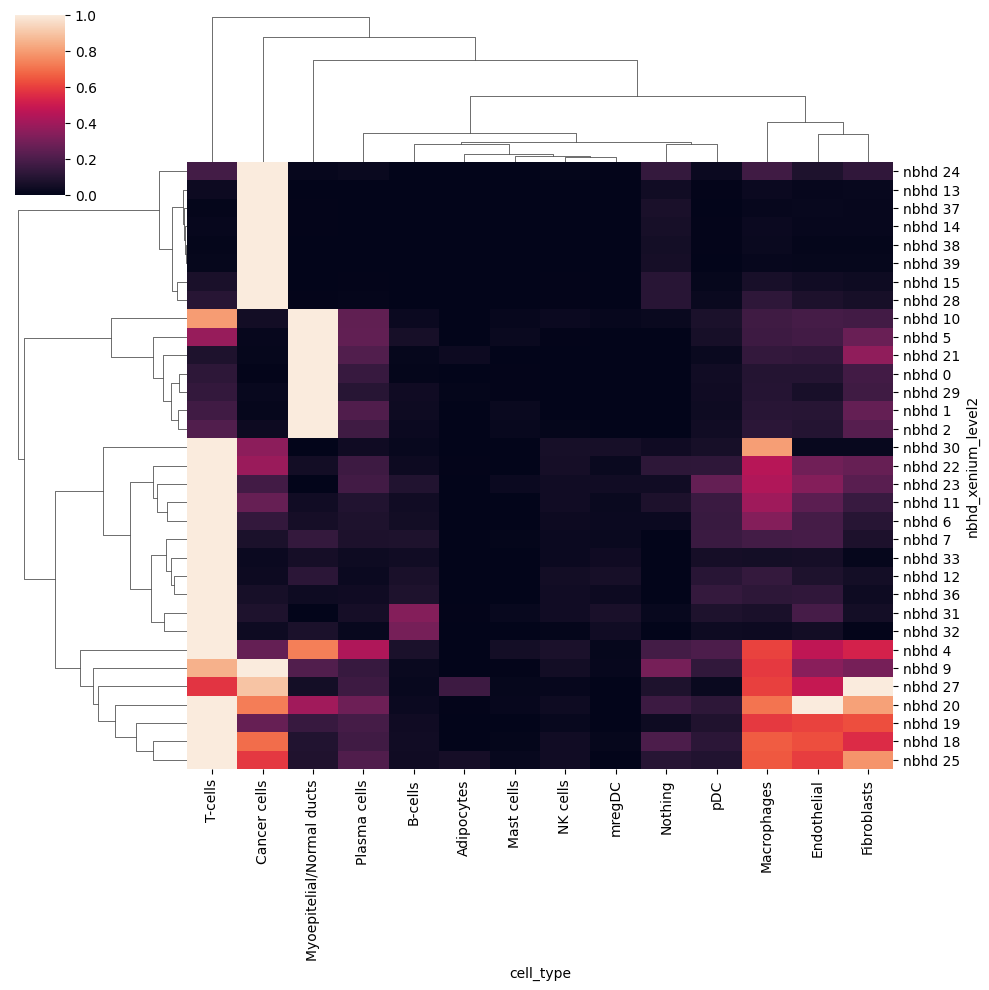

In [25]:
sns.clustermap(source, standard_scale=0)

In [26]:
dtype_to_volume = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled']

outputs = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl'), 'rb')
)
section_ids = outputs['section_ids']
section_positions = outputs['section_positions']
section_ids, section_positions

([('HT206B1-U1', 'xenium'),
  ('HT206B1-U2', 'multiplex'),
  ('HT206B1-U4', 'he'),
  ('HT206B1-U5', 'multiplex'),
  ('HT206B1-U8', 'xenium'),
  ('HT206B1-U9', 'xenium'),
  ('HT206B1-U10', 'multiplex'),
  ('HT206B1-U12', 'he'),
  ('HT206B1-U13', 'multiplex'),
  ('HT206B1-U16', 'xenium'),
  ('HT206B1-U17', 'xenium'),
  ('HT206B1-U18', 'multiplex'),
  ('HT206B1-U20', 'he'),
  ('HT206B1-U21', 'multiplex'),
  ('HT206B1-U24', 'xenium')],
 array([ 0,  1,  3,  4,  8,  9, 10, 12, 13, 16, 17, 18, 20, 21, 24]))

In [27]:
outputs['dtype_to_cluster_to_agg']['xenium'][-1]

{0: (0, 1, 0),
 1: (0, 1, 1),
 2: (0, 2, 1),
 3: (0, 3, 1),
 4: (1, 2, 0),
 5: (1, 2, 1),
 6: (1, 3, 0),
 7: (1, 3, 1),
 8: (2, 0, 0),
 9: (2, 2, 0),
 10: (2, 2, 1),
 11: (2, 3, 0),
 12: (2, 3, 1),
 13: (3, 0, 0),
 14: (3, 1, 0),
 15: (3, 2, 0),
 16: (3, 2, 1),
 17: (3, 3, 0),
 18: (4, 0, 0),
 19: (4, 0, 1),
 20: (4, 2, 0),
 21: (4, 2, 1),
 22: (4, 3, 0),
 23: (4, 3, 1),
 24: (5, 0, 0),
 25: (5, 0, 1),
 26: (5, 1, 0),
 27: (5, 1, 1),
 28: (5, 2, 0),
 29: (5, 2, 1),
 30: (5, 3, 0),
 31: (5, 3, 1),
 32: (6, 0, 0),
 33: (6, 0, 1),
 34: (6, 1, 0),
 35: (6, 1, 1),
 36: (6, 3, 1),
 37: (7, 0, 0),
 38: (7, 1, 0),
 39: (7, 3, 0)}

In [28]:
np.unique(dtype_to_volume['xenium'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39])

In [29]:
labeled = dtype_to_volume['xenium']
np.unique(labeled)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39])

In [30]:
def get_nbhd_rgb(dtype='xenium', nbhds=None, cmap=None, level=-1):
    labeled = dtype_to_volume[dtype][0]

    rgb = vis_utils.display_labeled_as_rgb(
        labeled, preserve_indices=True, label_to_hierarchy=outputs['dtype_to_cluster_to_agg'][dtype][level])
    
    if nbhds is not None:
        m = np.zeros_like(labeled, dtype=bool)
        for l in nbhds:
            m |= labeled==l

        rgb[~m] = 0.
    
    return rgb

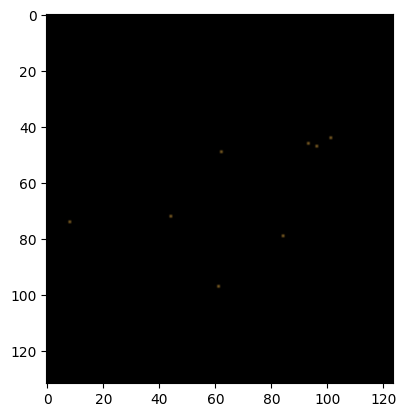

In [31]:
rgb = get_nbhd_rgb(nbhds=[30])
plt.imshow(rgb)

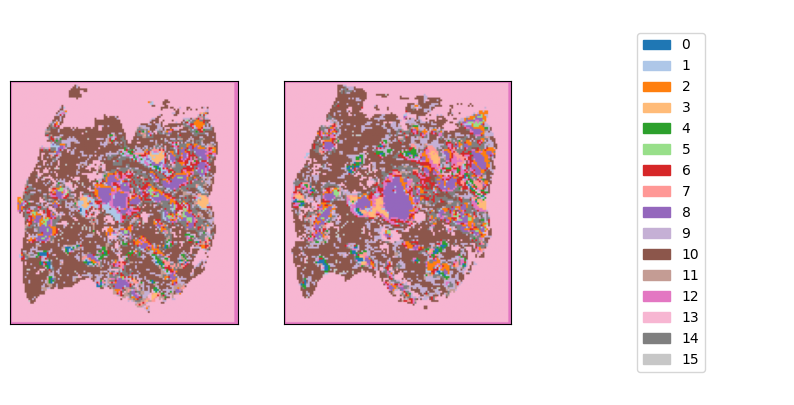

In [32]:
mushroom.display_clusters('integrated', section_idxs=[0, -1], figsize=(10, 5))

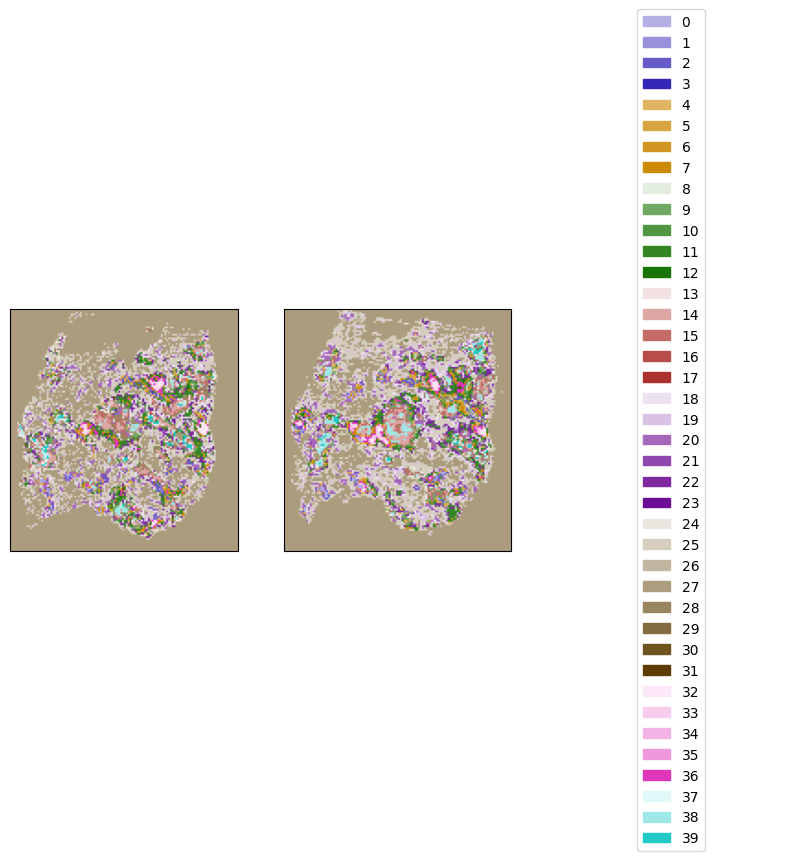

In [33]:
mushroom.display_clusters('xenium', section_idxs=[0, -1], figsize=(10, 5), level=-1)

In [34]:
spore = mushroom.dtype_to_spore['xenium']

In [35]:
spore.learner_data.dtype_to_section_to_adata['xenium'].keys()

dict_keys(['HT206B1-U1', 'HT206B1-U8', 'HT206B1-U9', 'HT206B1-U16', 'HT206B1-U17', 'HT206B1-U24'])

In [36]:
a = spore.learner_data.dtype_to_section_to_adata['xenium']['HT206B1-U1']
a

AnnData object with n_obs × n_vars = 115764 × 377
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nbhd_xenium_level0', 'nbhd_integrated_level0', 'nbhd_multiplex_level0', 'nbhd_xenium_level1', 'nbhd_integrated_level1', 'nbhd_multiplex_level1', 'nbhd_xenium_level2', 'nbhd_integrated_level2', 'nbhd_multiplex_level2'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p'
    obsm: 'spatial'

In [38]:
meta = pd.read_csv(
    '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/auxiliary/xenium/HT206B1-H2L1Us1_17_cell_type.txt',
    sep='\t', index_col=0
)
a.obs = pd.merge(a.obs, meta, left_index=True, right_index=True, how='left')
a.obs['cell_type_specific'] = a.obs['cell_type'].to_list()
a.obs

,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,...,nbhd_integrated_level0,nbhd_multiplex_level0,nbhd_xenium_level1,nbhd_integrated_level1,nbhd_multiplex_level1,nbhd_xenium_level2,nbhd_integrated_level2,nbhd_multiplex_level2,cell_type,cell_type_specific
cell_id,,,,,,,,,,,,,,,,,,,,,
aaaaeefm-1,1352.328735,856.673035,76,0,0,0,0,76,242.895478,35.447658,...,nbhd 6,nbhd 2,nbhd 14,nbhd 12,nbhd 7,nbhd 22,nbhd 9,nbhd 8,Nothing,Nothing
aaaagokl-1,1441.802612,871.474121,30,0,0,0,0,30,704.798776,22.397501,...,nbhd 1,nbhd 4,nbhd 15,nbhd 10,nbhd 13,nbhd 25,nbhd 12,nbhd 17,Cancer cells,Cancer cells
aaaaippd-1,1468.341553,860.412964,103,0,0,0,0,103,547.474395,48.452658,...,nbhd 8,nbhd 0,nbhd 15,nbhd 2,nbhd 3,nbhd 25,nbhd 12,nbhd 3,Cancer cells,Cancer cells
aaaajeja-1,1411.193359,855.234680,57,0,0,0,0,57,537.630332,29.938595,...,nbhd 1,nbhd 4,nbhd 15,nbhd 10,nbhd 13,nbhd 25,nbhd 12,nbhd 17,Cancer cells,Cancer cells
aaablpen-1,1449.760132,858.455505,24,0,0,0,0,24,182.792507,12.824375,...,nbhd 1,nbhd 4,nbhd 15,nbhd 10,nbhd 13,nbhd 25,nbhd 12,nbhd 17,Cancer cells,Cancer cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oikcfelo-1,4173.947266,2610.432129,75,0,0,0,0,75,163.691412,25.603595,...,nbhd 6,nbhd 4,nbhd 14,nbhd 9,nbhd 11,nbhd 22,nbhd 14,nbhd 14,T-cells,T-cells
oikcgcbk-1,4191.832520,2608.656738,73,0,0,0,0,73,122.734692,18.107657,...,nbhd 6,nbhd 4,nbhd 14,nbhd 9,nbhd 11,nbhd 22,nbhd 14,nbhd 14,T-cells,T-cells
oikdmjki-1,4163.305664,2615.778076,152,0,0,0,0,152,233.864227,29.893439,...,nbhd 6,nbhd 4,nbhd 14,nbhd 9,nbhd 11,nbhd 22,nbhd 14,nbhd 14,Plasma cells,Plasma cells


In [39]:
f = a[a.obs['cell_type']=='T-cells'].copy()
f

AnnData object with n_obs × n_vars = 25995 × 377
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nbhd_xenium_level0', 'nbhd_integrated_level0', 'nbhd_multiplex_level0', 'nbhd_xenium_level1', 'nbhd_integrated_level1', 'nbhd_multiplex_level1', 'nbhd_xenium_level2', 'nbhd_integrated_level2', 'nbhd_multiplex_level2', 'cell_type', 'cell_type_specific'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p'
    obsm: 'spatial'

In [40]:
sc.pp.pca(f)
sc.pp.neighbors(f)
sc.tl.umap(f)

In [41]:
sc.tl.leiden(f)

... storing 'nbhd_xenium_level0' as categorical
... storing 'nbhd_integrated_level0' as categorical
... storing 'nbhd_multiplex_level0' as categorical
... storing 'nbhd_xenium_level1' as categorical
... storing 'nbhd_integrated_level1' as categorical
... storing 'nbhd_multiplex_level1' as categorical
... storing 'nbhd_xenium_level2' as categorical
... storing 'nbhd_integrated_level2' as categorical
... storing 'nbhd_multiplex_level2' as categorical
... storing 'cell_type' as categorical
... storing 'cell_type_specific' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


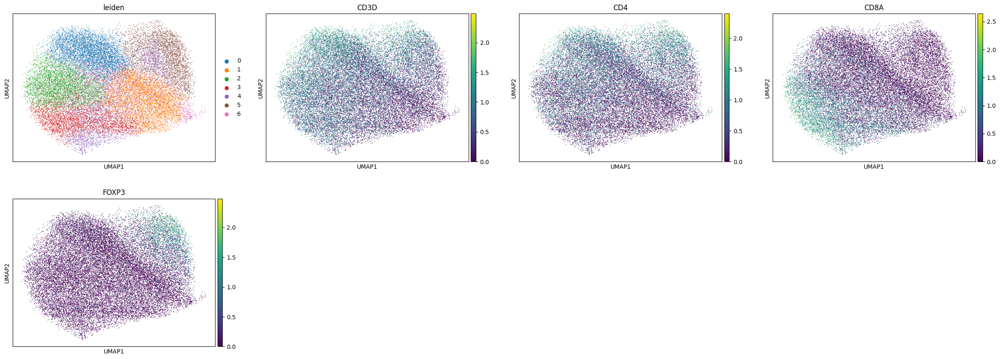

In [42]:
sc.pl.umap(f, color=['leiden', 'CD3D', 'CD4', 'CD8A', 'FOXP3'])

In [43]:
mapping = {
    'CD8 T cells': [2,3,4],
    'CD4 T cells': [0, 1, 6],
    'Treg': [5]
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
f.obs['cell_type_specific'] = [r_mapping[int(x)] for x in f.obs['leiden'].to_list()]
barcode_to_specific = {k:v for k, v in zip(f.obs.index.to_list(), f.obs['cell_type_specific'])}

In [44]:
a.obs['cell_type_specific'] = [barcode_to_specific.get(x, ct)
                               for x, ct in zip(a.obs.index.to_list(), a.obs['cell_type_specific'].to_list())]

In [45]:
set(a.obs['cell_type_specific'])

{'Adipocytes',
 'B-cells',
 'CD4 T cells',
 'CD8 T cells',
 'Cancer cells',
 'Endothelial',
 'Fibroblasts',
 'Macrophages',
 'Mast cells',
 'Myoepitelial/Normal ducts',
 'NK cells',
 'Nothing',
 'Plasma cells',
 'Treg',
 'mregDC',
 nan,
 'pDC'}

#### come up with new cell types

In [23]:
# adata = sc.read_h5ad('/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s2_HT413C1-Th1k4A1-U19_xenium.h5ad')
# sc.pp.normalize_total(adata)
# sc.pp.log1p(adata)
# adata

In [24]:
spore = mushroom.dtype_to_spore['xenium']
spore.learner_data.dtype_to_section_to_adata['xenium'].keys()

dict_keys(['HT413C1-Th1k4A1-U19', 'HT413C1-Th1k4A1-U2', 'HT413C1-Th1k4A1-U9', 'HT413C1-Th1k4A1-U25', 'HT413C1-Th1k4A1-U36'])

In [26]:
a = spore.learner_data.dtype_to_section_to_adata['xenium']['HT413C1-Th1k4A1-U19']
a

AnnData object with n_obs × n_vars = 102724 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nbhd_xenium_level0', 'nbhd_integrated_level0', 'nbhd_multiplex_level0', 'nbhd_xenium_level1', 'nbhd_integrated_level1', 'nbhd_multiplex_level1', 'nbhd_xenium_level2', 'nbhd_integrated_level2', 'nbhd_multiplex_level2'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p'
    obsm: 'spatial'

In [42]:
a = sc.read_h5ad('/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s2_HT413C1-Th1k4A1-U19_xenium.h5ad')
sc.pp.normalize_total(a)
sc.pp.log1p(a)
a

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


AnnData object with n_obs × n_vars = 102724 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p'
    obsm: 'spatial'

In [43]:
sc.pp.pca(a)
sc.pp.neighbors(a)
sc.tl.umap(a)

In [55]:
sc.tl.leiden(a, resolution=2.)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


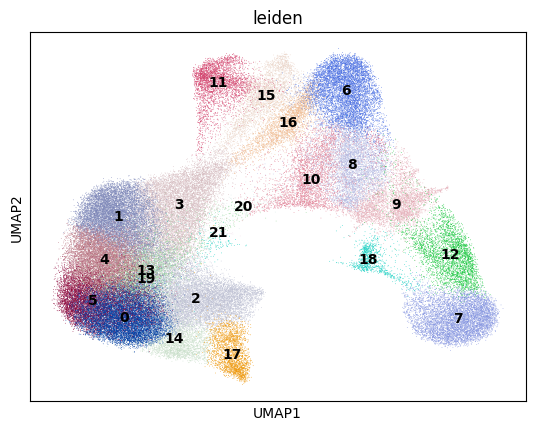

In [57]:
sc.pl.umap(a, color=['leiden'], legend_loc='on data')

In [73]:
mapping = {
    'T cells': [8],
    'Macrophage': [10],
    'Epithelial': [5, 0, 14, 17, 2, 19, 13, 4, 1, 3, 21, 20],
    'Endothelial': [11],
    'Fibroblast': [15, 16, 6],
    'Hepatocyte': [7, 12, 18],
    'Nothing': [9],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
a.obs['cell_type'] = [r_mapping[int(x)] for x in a.obs['leiden'].to_list()]

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


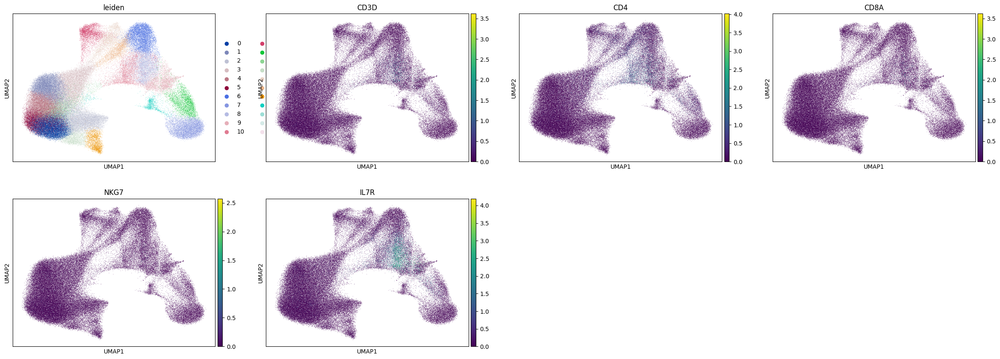

In [59]:
sc.pl.umap(a, color=['leiden', 'CD3D', 'CD4', 'CD8A', 'NKG7', 'IL7R'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


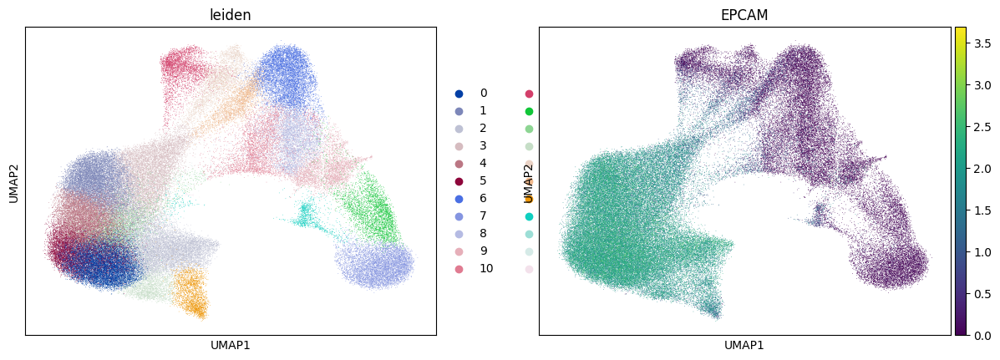

In [60]:
sc.pl.umap(a, color=['leiden', 'EPCAM'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


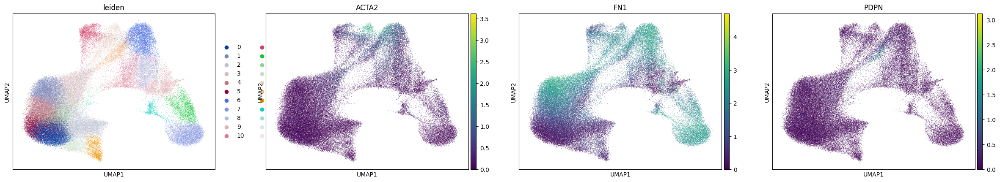

In [61]:
sc.pl.umap(a, color=['leiden', 'ACTA2', 'FN1', 'PDPN'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


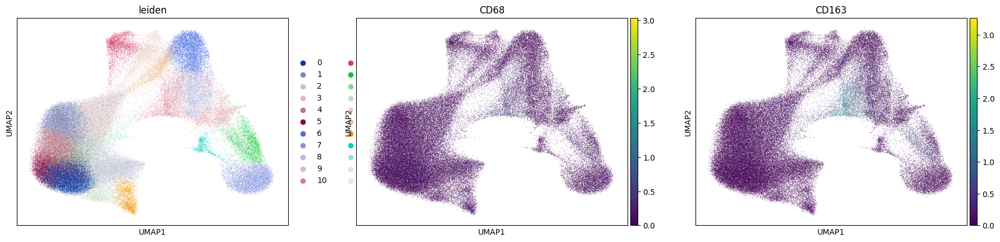

In [62]:
sc.pl.umap(a, color=['leiden', 'CD68', 'CD163'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


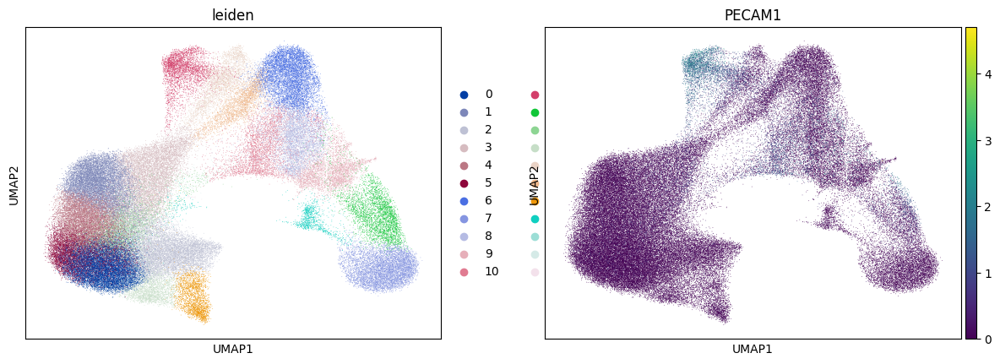

In [63]:
sc.pl.umap(a, color=['leiden', 'PECAM1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


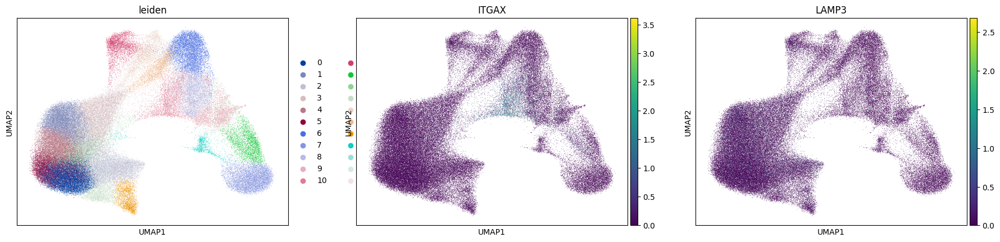

In [64]:
sc.pl.umap(a, color=['leiden', 'ITGAX', 'LAMP3'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


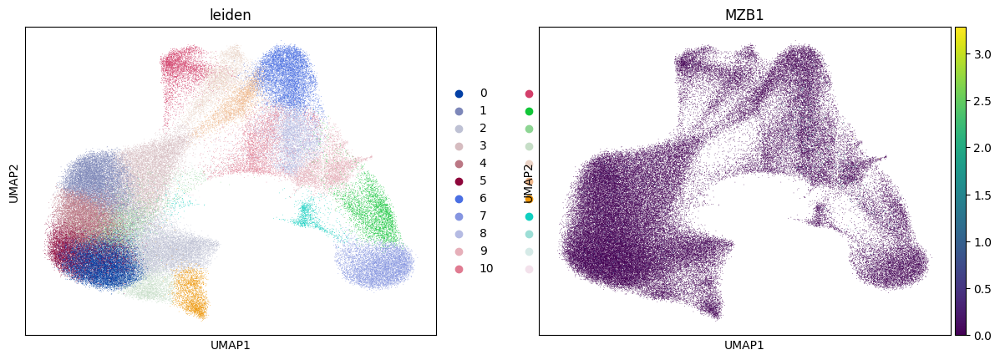

In [65]:
sc.pl.umap(a, color=['leiden', 'MZB1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


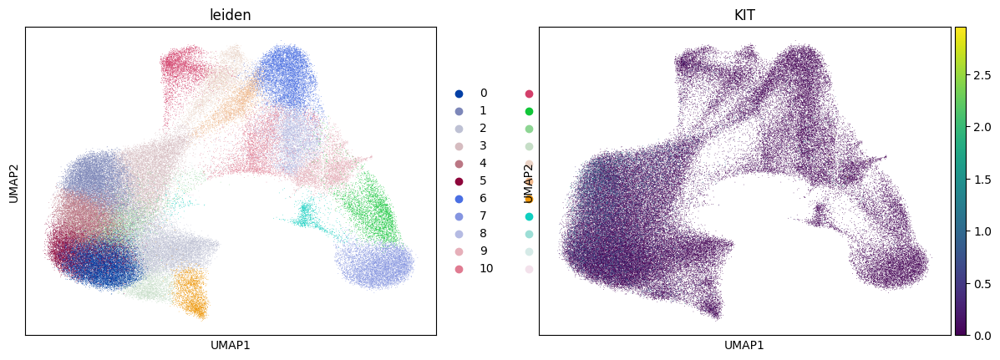

In [66]:
sc.pl.umap(a, color=['leiden', 'KIT'])

In [69]:

f = a[a.obs['cell_type']=='T cells'].copy()
f

AnnData object with n_obs × n_vars = 4910 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [70]:
sc.pp.pca(f)
sc.pp.neighbors(f)
sc.tl.umap(f)

In [71]:
sc.tl.leiden(f)

... storing 'cell_type' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


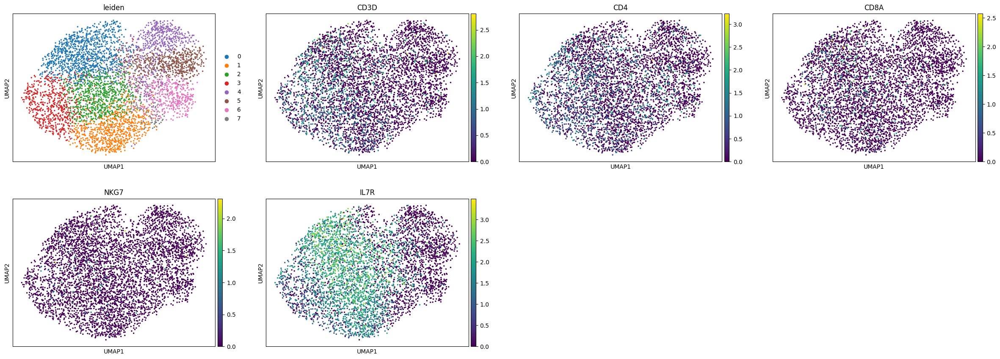

In [72]:
sc.pl.umap(f, color=['leiden', 'CD3D', 'CD4', 'CD8A', 'NKG7', 'IL7R'])

##### cellchat

In [79]:
# make sure we get all genes and raw counts
adata = sc.read_h5ad('/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s2_HT413C1-Th1k4A1-U19_xenium.h5ad')
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


AnnData object with n_obs × n_vars = 102724 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p'
    obsm: 'spatial'

In [80]:
# adata.obs = pd.merge(adata.obs, a.obs[['cell_type_specific']], left_index=True, right_index=True, how='left')

adata.obs = pd.merge(adata.obs, a.obs[['cell_type']], left_index=True, right_index=True, how='left')
adata.obs['cell_type_specific'] = adata.obs['cell_type'].to_list()


adata = adata[~pd.isnull(adata.obs['cell_type_specific'])]
adata = adata[adata.obs['cell_type_specific']!='Nothing']
adata

View of AnnData object with n_obs × n_vars = 98866 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'cell_type', 'cell_type_specific'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'ppm', 'spatial', 'log1p'
    obsm: 'spatial'

In [81]:
meta = adata.obs[['cell_type_specific']].copy()
meta['samples'] = 'sample'
meta.columns = ['cell_type', 'sample']
meta

,cell_type,sample
cell_id,,
aaaaahcn-1,Fibroblast,sample
aaaaibcn-1,Endothelial,sample
aaacfenh-1,Fibroblast,sample
aaachjof-1,Fibroblast,sample
aaackgcj-1,Epithelial,sample
...,...,...
oikknkjj-1,Epithelial,sample
oiklcojn-1,Epithelial,sample
oikmapjm-1,Epithelial,sample


In [82]:
coordinates = pd.DataFrame(data=np.asarray(adata.obsm['spatial']), columns=['x', 'y'], index=meta.index.to_list())
coordinates.index.name = 'cell_id'
coordinates

,x,y
cell_id,,
aaaaahcn-1,1017,1705
aaaaibcn-1,1017,1694
aaacfenh-1,1027,1693
aaachjof-1,1029,1702
aaackgcj-1,1029,1686
...,...,...
oikknkjj-1,2523,1530
oiklcojn-1,2536,1533
oikmapjm-1,2527,1535


In [83]:
exp = pd.DataFrame(data=adata.X.toarray(), columns=adata.var.index.to_list(), index=adata.obs.index.to_list())
exp.index.name = 'cell_id'
exp

,ABCC11,ACAN,ACE2,ACKR1,ACTA2,ACTG2,ADAM28,ADAMTS1,ADGRE1,ADGRL4,...,UCHL1,UMOD,UPK3B,VCAN,VEGFA,VIM,VPREB1,VSIG4,VWA5A,VWF
cell_id,,,,,,,,,,,,,,,,,,,,,
aaaaahcn-1,0.0,0.0,0.0,0.0,0.961193,0.000000,0.0,0.591893,0.0,0.000000,...,0.0,0.0,0.0,0.961193,0.000000,2.793661,0.0,0.0,0.0,0.000000
aaaaibcn-1,0.0,0.0,0.0,0.0,1.333651,1.333651,0.0,0.000000,0.0,1.333651,...,0.0,0.0,0.0,0.000000,0.000000,3.150981,0.0,0.0,0.0,0.000000
aaacfenh-1,0.0,0.0,0.0,0.0,1.922683,0.000000,0.0,1.080594,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,2.173127,0.0,0.0,0.0,0.000000
aaachjof-1,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,1.524622,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,2.466422,0.0,0.0,0.0,0.000000
aaackgcj-1,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,2.083466,1.507655,0.000000,0.0,0.0,0.0,2.083466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oikknkjj-1,0.0,0.0,0.0,0.0,0.000000,1.057551,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,1.057551,0.000000,0.000000,0.0,0.0,0.0,0.000000
oiklcojn-1,0.0,0.0,0.0,0.0,0.000000,0.408547,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,1.799446,0.921831,0.0,0.0,0.0,0.000000
oikmapjm-1,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.572701,1.199708,1.858069,0.0,0.0,0.0,0.000000


In [86]:
for sid in set(combined['sid']):
    print(sid)
    df = combined[combined['sid']==sid]
    df.index = ['-'.join(x.split('-')[-2:]) for x in df.index.to_list()]
    df = pd.merge(df, meta, left_index=True, right_index=True)
    print(df.shape)

df = combined[combined['sid']=='HT413C1-Th1k4A1-U19']
df.index = ['-'.join(x.split('-')[-2:]) for x in df.index.to_list()]
df = pd.merge(df, meta, left_index=True, right_index=True)

df.index.name = 'cell_id'

HT413C1-Th1k4A1-U2
(3, 12)
HT413C1-Th1k4A1-U9
(1, 12)
HT413C1-Th1k4A1-U36
(4, 12)
HT413C1-Th1k4A1-U19
(98866, 12)
HT413C1-Th1k4A1-U25
(5, 12)


In [87]:
df

,nbhd_xenium_level0,nbhd_integrated_level0,nbhd_multiplex_level0,nbhd_xenium_level1,nbhd_integrated_level1,nbhd_multiplex_level1,nbhd_xenium_level2,nbhd_integrated_level2,nbhd_multiplex_level2,sid,cell_type,sample
cell_id,,,,,,,,,,,,
aaaaahcn-1,nbhd 0,nbhd 12,nbhd 3,nbhd 0,nbhd 19,nbhd 8,nbhd 1,nbhd 10,nbhd 15,HT413C1-Th1k4A1-U19,Fibroblast,sample
aaaaibcn-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19,Endothelial,sample
aaacfenh-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19,Fibroblast,sample
aaachjof-1,nbhd 0,nbhd 12,nbhd 3,nbhd 0,nbhd 19,nbhd 8,nbhd 1,nbhd 10,nbhd 15,HT413C1-Th1k4A1-U19,Fibroblast,sample
aaackgcj-1,nbhd 0,nbhd 12,nbhd 0,nbhd 0,nbhd 19,nbhd 1,nbhd 0,nbhd 10,nbhd 2,HT413C1-Th1k4A1-U19,Epithelial,sample
...,...,...,...,...,...,...,...,...,...,...,...,...
oikknkjj-1,nbhd 1,nbhd 18,nbhd 7,nbhd 6,nbhd 12,nbhd 21,nbhd 12,nbhd 12,nbhd 35,HT413C1-Th1k4A1-U19,Epithelial,sample
oiklcojn-1,nbhd 1,nbhd 18,nbhd 7,nbhd 6,nbhd 12,nbhd 21,nbhd 12,nbhd 12,nbhd 35,HT413C1-Th1k4A1-U19,Epithelial,sample
oikmapjm-1,nbhd 1,nbhd 18,nbhd 7,nbhd 6,nbhd 12,nbhd 21,nbhd 12,nbhd 12,nbhd 35,HT413C1-Th1k4A1-U19,Epithelial,sample


In [88]:
cellchat_dir = os.path.join(project_dir, case, 'cellchat', 'HT413C1-Th1k4A1-U19')
Path(cellchat_dir).mkdir(parents=True, exist_ok=True)

In [89]:
meta.to_csv(os.path.join(cellchat_dir, 'meta.txt'), sep='\t')
coordinates.to_csv(os.path.join(cellchat_dir, 'coordinates.txt'), sep='\t')
exp.to_csv(os.path.join(cellchat_dir, 'expression.txt'), sep='\t')
df.loc[adata.obs.index.to_list()].to_csv(os.path.join(cellchat_dir, 'nbhds.txt'), sep='\t')

In [90]:
coordinates.shape, exp.shape, meta.shape, df.loc[adata.obs.index.to_list()].shape

((98866, 2), (98866, 477), (98866, 2), (98866, 12))

In [91]:
set(df.loc[adata.obs.index.to_list()]['nbhd_integrated_level2'])

{'nbhd 0',
 'nbhd 1',
 'nbhd 10',
 'nbhd 11',
 'nbhd 12',
 'nbhd 13',
 'nbhd 14',
 'nbhd 15',
 'nbhd 16',
 'nbhd 17',
 'nbhd 18',
 'nbhd 19',
 'nbhd 2',
 'nbhd 20',
 'nbhd 21',
 'nbhd 22',
 'nbhd 3',
 'nbhd 4',
 'nbhd 5',
 'nbhd 6',
 'nbhd 7',
 'nbhd 8'}

#### analysis

In [64]:
fps = sorted(utils.listfiles(os.path.join(project_dir, 'analysis', 'cellchat', case), regex=r'integrated.*txt$'))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_0.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_1.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_10.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_11.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_12.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_13.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_14.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT206B1/nbhd_integrated_level2-nbhd_2.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/analysis/cellchat/HT20

In [65]:
cellchat = pd.read_csv(fps[0], sep='\t')
cellchat

,source,target,ligand,receptor,prob,pval,interaction_name,interaction_name_2,pathway_name,annotation,evidence
1,Mast cells,Fibroblasts,AREG,EGFR,8.728859e-07,0.03,AREG_EGFR,AREG - EGFR,EGF,Secreted Signaling,KEGG: hsa04012
2,B-cells,B-cells,CCL19,CCR7,3.245290e-05,0.00,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
3,CD4 T cells,B-cells,CCL19,CCR7,1.087604e-04,0.00,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
4,CD8 T cells,B-cells,CCL19,CCR7,6.327840e-07,0.00,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
5,Endothelial,B-cells,CCL19,CCR7,3.196526e-06,0.00,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
...,...,...,...,...,...,...,...,...,...,...,...
268,Macrophages,Plasma cells,SELL,CD34,4.426983e-06,0.02,SELL_CD34,SELL - CD34,SELL,Cell-Cell Contact,PMID: 7692600; PMID: 8977216
269,pDC,Plasma cells,SELL,CD34,1.761548e-05,0.00,SELL_CD34,SELL - CD34,SELL,Cell-Cell Contact,PMID: 7692600; PMID: 8977216
270,Plasma cells,Plasma cells,SELL,CD34,3.391152e-06,0.04,SELL_CD34,SELL - CD34,SELL,Cell-Cell Contact,PMID: 7692600; PMID: 8977216
271,Treg,Plasma cells,SELL,CD34,3.997561e-06,0.00,SELL_CD34,SELL - CD34,SELL,Cell-Cell Contact,PMID: 7692600; PMID: 8977216


In [67]:
source = cellchat.copy()
source = source[['source', 'target']]
source['value'] = 1
source = pd.pivot_table(source, columns='target', index='source', values='value', aggfunc='sum')
source[pd.isnull(source)] = 0.
source

target,B-cells,CD4 T cells,CD8 T cells,Endothelial,Fibroblasts,Macrophages,Mast cells,Myoepitelial/Normal ducts,Plasma cells,Treg,pDC
source,,,,,,,,,,,
B-cells,4.0,6.0,6.0,5.0,2.0,3.0,0.0,1.0,5.0,0.0,0.0
CD4 T cells,5.0,4.0,4.0,4.0,1.0,2.0,0.0,2.0,4.0,1.0,5.0
CD8 T cells,5.0,3.0,3.0,4.0,1.0,2.0,0.0,0.0,3.0,1.0,1.0
Endothelial,5.0,5.0,5.0,7.0,5.0,5.0,5.0,4.0,5.0,3.0,5.0
Fibroblasts,1.0,1.0,1.0,4.0,1.0,2.0,2.0,3.0,3.0,1.0,1.0
Macrophages,2.0,4.0,4.0,7.0,2.0,3.0,1.0,1.0,5.0,0.0,2.0
Mast cells,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0
Myoepitelial/Normal ducts,2.0,2.0,2.0,3.0,2.0,2.0,0.0,4.0,3.0,1.0,2.0
Plasma cells,3.0,2.0,3.0,3.0,2.0,2.0,2.0,0.0,3.0,2.0,2.0
